# Phase1-Rebuild 3D PointCloud

In [1]:
from segment_anything import sam_model_registry, SamAutomaticMaskGenerator
import torch
from PIL import Image
from segment_anything.modeling.sam import Sam
from typing import Tuple, List
from torchvision.transforms.transforms import Compose
import matplotlib.pyplot as plt
import numpy as np
import clip
import cv2
from pathlib import Path
import os
import shutil
from hloc import extract_features
import cv2
import h5py
import numpy as np
import matplotlib.pyplot as plt
from tqdm import tqdm
from itertools import combinations
from typing import List
from hloc import match_features
from hloc.utils.parsers import names_to_pair
from hloc import reconstruction
import subprocess
import pickle
from sklearn.metrics.pairwise import cosine_similarity
import open3d as o3d
from read_write_model import read_cameras_binary, read_images_binary
from open3d.geometry import PointCloud

device = "cuda" if torch.cuda.is_available() else "cpu"

Jupyter environment detected. Enabling Open3D WebVisualizer.
[Open3D INFO] WebRTC GUI backend enabled.
[Open3D INFO] WebRTCWindowSystem: HTTP handshake server disabled.


In [2]:
def get_sorted_paths(folder: Path, format: str) -> List[Path]:
    """
    Gvien a folder, the function returns all the paths ending with .{format} after sorted.
    """
    sorted_paths = sorted(folder.glob(f"*.{format}"))
    return sorted_paths

In [3]:
def save_masks_npz(masks: List[dict], path: Path):
    """
    Save the masks to npz.
    """
    path.parent.mkdir(parents=True, exist_ok=True)
    np.savez_compressed(path, masks=masks)

In [4]:
def load_masks_npz(path: str):
    """
    Load the masks npz to numpy.
    """
    return np.load(path, allow_pickle=True)['masks']

In [5]:
def save_dict(path: Path, target: dict):
    """
    Save a dictionary.
    """
    with open(path, 'wb') as f:
        pickle.dump(target, f)

In [6]:
def load_dict(path: Path) -> dict:
    """
    Load a dictionary.
    """
    with open(path, 'rb') as f:
        loaded_dict = pickle.load(f)
    return loaded_dict

In [7]:
def show_masks(masks: List[dict], image: np.array):
    """
    Visualize the instance-segmentated image.
    """
    vis = image.astype(np.float32).copy()
    for m in masks:
        mask  = m["segmentation"]
        color = np.random.rand(3)
        vis[mask] = vis[mask] * 0.5 + color * 255 * 0.5
    plt.figure(figsize=(8, 8))
    plt.imshow(vis.astype(np.uint8))
    plt.axis("off"); plt.title(f"SAM masks = {len(masks)}")
    plt.show()

In [8]:
def sam_instance_seg(image: np.array, sam: Sam, visualization: bool = False) -> list:
    """
    Perform instance segmentation using SAM (segmentation anything model). 

    Args:
        img_path (np.array): 
            The image.
        sam (Sam):
            Sam model for segmentation, with pretrained parameters.
        visualization (bool):
            Whether to visualize the segmentated results.

    Returns: 
        masks (List[dict]):
            A list containing instance segmentation results for all the objects.
            Each result is contained in a dict, with various properties.
    """

    sam.eval().to(device)
    mask_generator = SamAutomaticMaskGenerator(
        sam,
        points_per_side = 12,      
        points_per_batch = 32,
        crop_n_layers = 0,
        pred_iou_thresh = 0.9,     
        stability_score_thresh = 0.9,
        min_mask_region_area = 5000
    )

    masks = mask_generator.generate(image)
    
    if visualization:
        show_masks(masks, image)

    del mask_generator
    
    return masks

In [9]:
def mask_img(image: np.array, mask: np.array) -> np.array:
    """
    Mask the image and return the result.
    """
    masked_image = image.copy()
    masked_image[~mask] = 0
    return masked_image

In [10]:
def combine_masks(masks: List[dict], labels: np.array, exclude_indices: list) -> np.array:
    """
    Combine all the masks stored in the dictionary and save as np array.
    Specific masks can be excluded according to its corresponding category (label).

    Args:
        masks (List[dict]):
            Masks returned by SAM.
        labels (np.array):
            The corresponding categories (labels) for the masks.
        exclude_indices (list):
            Which category to exclude.
    
    Returns:
        union_mask (np.array):
            The combined mask.
        
    """
    union_mask = np.zeros_like(masks[0]['segmentation'], dtype=bool)
    for i in range(labels.shape[0]):
        if labels[i] not in exclude_indices: 
            union_mask = np.logical_or(union_mask, masks[i]['segmentation'])
    return union_mask

In [11]:
def crop_img(image: np.array, mask: dict, visualization: bool = 0) -> Image.Image:
    """
    Crop an object from the original image according to the bounding box from the mask.

    Args:
        image (np.array)
            The image to crop.
        mask (dict):
            The mask according to which the image is cropped.

    Returns:
        cropped_pil (Image.Image):
            The cropped image.
    """
    masked_image = mask_img(image, mask['segmentation'])
    
    # Calculation of the crop boundary.
    x_min, y_min, w, h = mask["bbox"]
    x_max = x_min + w
    y_max = y_min + h
    cropped = masked_image[y_min:y_max, x_min:x_max]

    if visualization:
        plt.figure(figsize=(6, 6))
        plt.imshow(cropped)
        plt.axis("off")
        plt.title("Masked Image")
        plt.show()

    cropped_pil = Image.fromarray(cropped)
    
    return cropped_pil

In [12]:
def CLIP_cls(img: Image.Image, clip_model: clip.model.CLIP, preprocess: Compose, visualization: bool = 0) -> Tuple[int, dict]:
    """
    Use CLIP to classify image to a set of predefined labels.
    
    Args:
        img (Image.Image):
            The image to be classified.
        clip_model (clip.model.CLIP):
            CLIP model.
        preprocess (Compose):
            The preprocess pipeline for CLIP models.
    
    Returns:
        index (int):
            The predicted index of the categories defined below.
        scores (dict):
            The keys are the labels, with the probabilities as values.
    """
    scores = {}

    # Predifined labels (kind of hard coded).
    texts = ["many packages", "a single package", "a bundle of clothes", "a folded jacket", "a wrapped blanket", "a book", "background"]
    text_tokens = clip.tokenize(texts).to(device)

    image_input = preprocess(img).unsqueeze(0).to(device)

    with torch.no_grad():
        image_features = clip_model.encode_image(image_input)
        image_embedding = image_features.cpu().numpy()[0]
        text_features  = clip_model.encode_text(text_tokens)

        logits_per_image = (image_features @ text_features.T).softmax(dim=-1)
        probs = logits_per_image[0].cpu().numpy()

    for label, prob in zip(texts, probs):
        scores[label] = prob
    index = np.argmax(probs)

    if visualization:
        plt.figure(figsize=(6, 6))
        plt.imshow(img)
        plt.axis("off")
        plt.title("Masked Image")
        plt.show()
        print(texts[index])

    del text_tokens, image_input
    
    return index, scores, image_embedding

In [13]:
def instance_segmentation(
        images_folder: Path, 
        output_folder: Path, 
        image_reshape_size: Tuple[int, int] = None, 
        visualization: bool = 0, 
        image_type: str = "jpeg"
    ):
    """
    Perform instance segmentation to all the images in the images_folder and save the results respectively.

    Args:
        images_folder (Path):
            The image folder containing all the images to be segmentated.
        output_folder (Path):
            The folder to save the result masks.
        image_reshape_size (Tuple[int, int]):
            The size of reshaped images.
            If None, the images will not be reshaped.
        visualization (bool):
            Whether to visualize the segmentated results.
        image_type (str):
            The format of images to process, default as jpeg.
    """
    checkpoint_path = Path("sam_checkpoints/sam_vit_b_01ec64.pth")
    model_type = "vit_b"
    sam = sam_model_registry[model_type](checkpoint=checkpoint_path)

    if os.path.exists(output_folder):
        shutil.rmtree(output_folder)
    output_folder.mkdir(parents=True, exist_ok=True)
    
    for image_path in images_folder.glob(f"*.{image_type}"):
        image = cv2.cvtColor(cv2.imread(image_path), cv2.COLOR_BGR2RGB)
        if image_reshape_size:
            image = cv2.resize(image, image_reshape_size)

        masks = sam_instance_seg(image, sam, visualization=visualization)
        save_masks_npz(masks, output_folder / f"{str(image_path.stem)}_mask.npz")

    del sam

In [14]:
def clip_cls(
        images_folder: Path,
        masks_folder: Path, 
        output_folder: Path, 
        image_reshape_size: Tuple[int, int] = None, 
        visualization: bool = False, 
        image_type: str = "jpeg"
    ):
    """
    Classify each instance segmentation using clip.
    The image is croppe to bound the target instance before being classified by CLIP.
    The function saves the classification results as well as the image feature embeddings.
    The masks should have names <image_stem>_mask.npz so that CLIP can match the image with 
    the corresponding masks.

    Args:
        images_folder (Path):
            The folder that contains the images from where the instances segmentation is extracted.
        masks_folder (Path):
            The folder that contains the masks from instance segmentation.
        output_folder (Path):
            The folder containing the labels and embeddings.
        image_reshape_size (Tuple[int, int]):
            The size of reshaped images.
            If None, the images will not be reshaped.
        visualization (bool):
            Whether to visualize the segmentated results.
        image_type (str):
            The format of images to process, default as jpeg.
    """
    clip_model, preprocess = clip.load("ViT-B/32", device=device)

    if os.path.exists(output_folder):
        shutil.rmtree(output_folder)
    output_folder.mkdir(parents=True, exist_ok=True)

    for image_path in images_folder.glob(f"*.{image_type}"):
        indices = []
        embeddings = {}

        image = cv2.cvtColor(cv2.imread(image_path), cv2.COLOR_BGR2RGB)
        if image_reshape_size:
            image = cv2.resize(image, image_reshape_size)
        
        masks = load_masks_npz(masks_folder / Path(str(image_path.stem) + "_mask.npz"))

        for j in range(masks.shape[0]):
            mask = masks[j]
            cropped = crop_img(image, mask, visualization=0) # Crop the image to only include the classification target to have a better result.
            index, _, image_embeddings = CLIP_cls(cropped, clip_model, preprocess, visualization=visualization)
            indices.append(index)
            embeddings[j] = image_embeddings

        np.save(output_folder / f"{str(image_path.stem)}_label.npy", np.array(indices))
        save_dict(output_folder / f"{str(image_path.stem)}_embeddings.pkl", embeddings)

    del clip_model, preprocess

In [15]:
def remove_background(
        images_folder: Path, 
        masks_folder: Path, 
        labels_folder: Path, 
        output_folder: Path, 
        image_reshape_size: Tuple[int, int] = None, 
        image_type: str = "jpeg"
    ):
    """
    This function removes the background of the given images, and stores the resulted images
    and the background masks respectively.
    The masks should have names <image_name>_mask.npz and the labels should be named as
    <label_name>_label.npy for accurate matching.

    Args:
        images_folder (Path):
            The folder that contains the images from where the instances segmentation is extracted.
        masks_folder (Path):
            The folder that contains the masks from instance segmentation.
        labels_folder (Path):
            The folder that contains the labels for the masks.
        output_folder (Path):
            The folder containing the labels and embeddings.
        image_reshape_size (Tuple[int, int]):
            The size of reshaped images.
            If None, the images will not be reshaped.
        visualization (bool):
            Whether to visualize the segmentated results.
        image_type (str):
            The format of images to process, default as jpeg.
    """

    if os.path.exists(output_folder):
        shutil.rmtree(output_folder)
    Path(output_folder/ "bk_masks").mkdir(parents=True, exist_ok=True)
    Path(output_folder/ "images_without_bk").mkdir(parents=True, exist_ok=True)

    for image_path in images_folder.glob(f"*.{image_type}"):
        masks = load_masks_npz(Path(masks_folder / f"{str(image_path.stem)}_mask.npz"))
        labels = np.load(Path(labels_folder / f"{str(image_path.stem)}_label.npy"))

        image = cv2.cvtColor(cv2.imread(image_path), cv2.COLOR_BGR2RGB)
        if image_reshape_size:
            image = cv2.resize(image, image_reshape_size)

        union_mask = combine_masks(masks, labels, [6])

        masked_image = mask_img(image, union_mask)
        masked_bgr = cv2.cvtColor(masked_image, cv2.COLOR_RGB2BGR)

        np.save(Path(output_folder / "bk_masks" / f"{str(image_path.stem)}_bk_mask.npy"), union_mask)
        cv2.imwrite(Path(output_folder / "images_without_bk" / f"{str(image_path.stem)}.png"), masked_bgr)

In [16]:
def feature_description(images_path: Path, output_folder: Path):
    """
    The function extracts feature descriptors of all images in the images_path using 
    superpoint_point and store the results in the output_folder.

    Args:
        images_path (Path):
            The folder that contains all the images to be extracted features.
        output_folder (Path):
            Where to store the results.
    """
    feat_conf = extract_features.confs['superpoint_max']
    feat_conf['preprocessing']['resize_max'] = 1600
    feat_conf['model']['max_keypoints'] = 5000

    extract_features.main(feat_conf, images_path, output_folder, overwrite=True)

In [17]:
def feature_visualization(img_path: Path, feature_dir: Path):
    """
    Visualize the features of an image given the feature map.
    """
    with h5py.File(feature_dir, 'r') as f:
        img_name = img_path.name
        keypoints = f[img_name]['keypoints'][()]
        image = cv2.imread(str(img_path))
        image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

        for (x, y) in keypoints:
            cv2.circle(image_rgb, (int(x), int(y)), radius=2, color=(255, 0, 0), thickness=2)

        plt.figure(figsize=(10, 10))
        plt.imshow(image_rgb)
        plt.title(f"{img_name} — {len(keypoints)} keypoints")
        plt.axis('off')
        plt.show()

In [18]:
def write_image_pairs(image_names: List[str], output_path: Path, filename: str = "pairs.txt"):
    """
    Given a list of names, the function generates all the pairs of the names and stores the results
    in a .txt file.
    """
    pairs = combinations(image_names, 2) 
    lines = [f"{a} {b}\n" for a, b in pairs]

    pairs_file = output_path / filename
    pairs_file.write_text("".join(lines))

In [19]:
def read_pairs_txt(file_name: Path) -> set:
    """
    This function reads the pairs.txt and returns all the pairs in it.

    Returns:
        files_pair (set):
            The pairs contained in the given file.
    """
    pairs_file = Path(file_name)
    files_pair = set()
    with pairs_file.open('r') as f:
        for line in f:
            a, b = line.strip().split()   
            files_pair.add((a, b))

    return files_pair

In [20]:
def features_matching(pairs_file: Path, features: str, export_dir: Path):    
    """
    Match the features of images contained in the pairs_file.
    
    Args:
        pairs_file (Path):
            The .txt file indicating the pairs of files to match.
        features (str):
            The stem name of the feature file.
        export_dir (Path):
            The folder to store the matched results.
    """
    match_conf = match_features.confs['superglue']
    match_conf['model']['match_threshold'] = 0.1  
    match_conf['model']['sinkhorn_iterations'] = 20
    match_features.main(
        conf=match_conf,
        pairs=pairs_file,
        features=features,
        export_dir=export_dir,
        overwrite=True
    )

In [21]:
def matching_visualization(img1_path: Path, img2_path: Path, features_path: Path, matches_path: Path):
    """
    Given 2 images, their features map and matching results map, the function visualizes
    the matching results.
    """
    img1 = cv2.imread(str(img1_path))
    img2 = cv2.imread(str(img2_path))
    img1 = cv2.cvtColor(img1, cv2.COLOR_BGR2RGB)
    img2 = cv2.cvtColor(img2, cv2.COLOR_BGR2RGB)

    img1_name = img1_path.name
    img2_name = img2_path.name

    # Get features.
    with h5py.File(features_path, 'r') as f:
        key_points1 = f[img1_name]['keypoints'][()]
        key_points2 = f[img2_name]['keypoints'][()]

    # Get matching file pairs.
    pair_name = names_to_pair(img1_name, img2_name)
    with h5py.File(matches_path, 'r') as f:
        matches0 = f[pair_name]['matches0'][()]  

    valid = matches0 > -1
    matched_points1 = key_points1[valid]
    matched_points2 = key_points2[matches0[valid]]

    H1, W1 = img1.shape[:2]
    H2, W2 = img2.shape[:2]
    canvas = np.zeros((max(H1, H2), W1 + W2, 3), dtype=np.uint8)
    canvas[:H1, :W1] = img1
    canvas[:H2, W1:] = img2

    for pt1, pt2 in zip(matched_points1, matched_points2):
        x1, y1 = int(pt1[0]), int(pt1[1])
        x2, y2 = int(pt2[0]) + W1, int(pt2[1])  
        cv2.circle(canvas, (x1, y1), 2, (0, 255, 0), -1)
        cv2.circle(canvas, (x2, y2), 2, (0, 255, 0), -1)
        cv2.line(canvas, (x1, y1), (x2, y2), (255, 0, 0), 1)

    plt.figure(figsize=(15, 10))
    plt.imshow(canvas)
    plt.title(f"{img1_name} ↔ {img2_name} — {len(matched_points1)} matches")
    plt.axis('off')
    plt.show()

In [22]:
def generate_feature_descriptors(images_folder: Path, output_folder: Path, vis: bool = False):
    """
    Generate features for all the images in the images_folder.
    """
    if os.path.exists(output_folder):
        shutil.rmtree(output_folder)
    output_folder.mkdir(parents=True, exist_ok=True)

    # Get features.
    feature_description(images_folder, output_folder)

    # Visualization.
    if vis:
        feature_dir = Path(output_folder/"feats-superpoint-n4096-rmax1600.h5")
        for img_path in tqdm(images_folder.glob("*.png")):
            feature_visualization(img_path, feature_dir)

In [23]:
def images_matching(
        images_folder: Path, 
        output_folder: Path, 
        pairs_file: Path, 
        features_path: Path, 
        matches_path: Path, 
        vis: bool = False, 
        mode: str = "png"
    ):
    """
    The function match all image pairs (stored in the images_folder) indicated by the pairs_file,
    and returns the results.
    """
    image_names = [img_path.name for img_path in tqdm(images_folder.glob(f"*.{mode}"))]
    write_image_pairs(image_names, output_folder)

    features = 'feats-superpoint-n4096-rmax1600'
    features_matching(pairs_file, features, output_folder)

    if vis:
        pairs = read_pairs_txt(pairs_file)
        for pair in pairs:
            matching_visualization(Path(images_folder / pair[0]), Path(images_folder / pair[1]), features_path, matches_path)

In [24]:
def sparse_3D_reconstruction(
        images_path: Path, 
        pairs_path: Path, 
        features_path: Path, 
        matches_path: Path, 
        output_folder: Path
    ):
    """
    Peform SfM to get the sparse 3D point cloud as well as camera prameters.
    """
    reconstruction.main(
        image_dir=images_path,
        pairs=pairs_path,
        features=features_path,
        matches=matches_path,
        sfm_dir=output_folder,
        skip_geometric_verification=True,
        min_match_score = 0.05
    )

In [25]:
def visualize_colmap_depth(path: Path):
    """
    Visualization of the colmap depth file (.bin).
    """
    with open(path, 'rb') as f:
        header_bytes = bytearray()
        amp_count = 0
        while amp_count < 3:
            b = f.read(1)
            if not b:
                raise EOFError("Unexpected end of file while reading header")
            header_bytes += b
            if b == b'&':
                amp_count += 1

        header_str = header_bytes.decode('ascii').strip('&')
        width, height, channels = map(int, header_str.split('&'))

        count = width * height * channels
        data = np.fromfile(f, dtype=np.float32, count=count)
    data = data.reshape((height, width, channels))

    if channels == 1:
        data = data[:, :, 0]

    plt.figure(figsize=(10,6))
    plt.imshow(data, cmap='plasma', vmin=np.nanmin(data), vmax=np.nanpercentile(data,99))
    plt.colorbar(label='Depth')
    plt.axis('off')
    plt.title('COLMAP Depth Map')
    plt.show()


In [26]:
def images_undistortion(images_dir: Path, sparse_dir: Path, output_dir: Path):
    """
    Perform images undistortion given camera parameters.

    Args:
        sparse_dir (Path): 
            The folder that contains the binary file of the camera parameters.
    """
    if os.path.exists(output_dir):
        shutil.rmtree(output_dir)
    output_dir.mkdir(parents=True, exist_ok=True)

    subprocess.run([
            "colmap", "image_undistorter",
            "--image_path", str(images_dir),
            "--input_path", str(sparse_dir),
            "--output_path", str(output_dir),
            "--output_type", "COLMAP"
        ], check=True)

In [27]:
def load_colmap_depth_bin(bin_path: Path) -> np.array:
    """
    Load colmap depth .bin file as np.array.
    """
    with bin_path.open('rb') as f:
        header = bytearray(); amps = 0
        while amps < 3:
            b = f.read(1)
            header += b
            if b == b'&':
                amps += 1
        w, h, c = map(int, header.decode('ascii').strip('&').split('&'))
        data = np.fromfile(f, dtype=np.float32, count=w * h * c)
    depth = data.reshape((h, w, c))[:, :, 0]
    return depth

In [28]:
def save_colmap_depth_bin(depth: np.array, bin_out: Path):
    """
    Save depth np.array as .bin that can be identified by colmap.

    Args: 
        depth (np.array):
            Depth map in np.array.
    """
    depth = depth.astype(np.float32)
    h, w = depth.shape

    bin_out = Path(bin_out)
    bin_out.parent.mkdir(parents=True, exist_ok=True)

    with bin_out.open('wb') as f:
        f.write(f"{w}&{h}&1&".encode('ascii'))
        depth.ravel().tofile(f)

In [29]:
def depth_estimation(dense_dir: Path, mode: str = "geometric", vis: bool = False):
    """
    Generate depth map for the images.

    Args:
        dense_dir (Path):
            The folder of the results from images undistortion.
        mode (str):
            "geometric" or "photometric".
            Which depth to visualize.
        vis (bool):
            Whether to visualize the results.
    """
    depth_maps_dir = Path(dense_dir/"stereo"/"depth_maps")
    if depth_maps_dir.exists():
        for f in depth_maps_dir.iterdir():
            f.unlink()

    subprocess.run([
            "colmap", "patch_match_stereo",
            "--workspace_path", str(dense_dir),
            "--workspace_format", "COLMAP",
            "--PatchMatchStereo.geom_consistency", "true",
            "--PatchMatchStereo.filter", "true",
            "--PatchMatchStereo.depth_min", "7.5",
            "--PatchMatchStereo.depth_max", "17.0",
            "--PatchMatchStereo.filter_min_ncc", "0.05",
            "--PatchMatchStereo.min_triangulation_angle", "1",
            "--PatchMatchStereo.window_radius", "9"
        ], check=True)
    
    if vis:
        for depth_map in Path(dense_dir/"stereo"/"depth_maps").glob(f"*.{mode}.bin"):
            visualize_colmap_depth(depth_map)

In [30]:
def dense_3D_reconstruction(work_dir: Path, output_file: Path, mode: str):
    """
    Reconstruct the dense point cloud given the dense folder that contains imgaes, sparse, stereo, etc.

    Args:
        work_dir (Path):
            The folder that contains imgaes, sparse, stereo, etc.
        output_file (Path):
            The path of the result .ply file.
        mode (str);
            "geometric" or "photometric".
            "geometric" is more strict, less points, more consistent.
            
    """
    if os.path.exists(Path(work_dir/output_file)):
        os.remove(Path(work_dir/output_file))

    subprocess.run([
            "colmap", "stereo_fusion",
            "--workspace_path", str(work_dir),
            "--workspace_format", "COLMAP",
            "--input_type", mode,
            "--StereoFusion.min_num_pixels", "3",
            "--StereoFusion.max_reproj_error", "3",
            "--StereoFusion.max_depth_error",  "1",
            "--output_path", str(Path(work_dir/output_file)),
        ], check=True)

In [31]:
def match_embedding_dicts(dict1: dict, dict2: dict) -> List[tuple]:
    """
    Given two dictionaries with ids and the corresponding embeddings,
    the function pairs the embeddings greedily according to the similarity.

    Args:
        dict1, dict2 (dict):
            The dictionaries containing embeddings.
            {ID: embeddings}.
    
    Returns:
        matched_pairs (List[tuple]):  
            A list containing all the matched ids.
    """
    ids1 = list(dict1.keys())
    ids2 = list(dict2.keys())

    emb1 = np.stack([dict1[k] for k in ids1])
    emb2 = np.stack([dict2[k] for k in ids2])

    # Calculate a full-rank cost matrix.
    sim = cosine_similarity(emb1, emb2)

    matched_pairs = []
    used1 = set()
    used2 = set()

    while True:
        i, j = np.unravel_index(np.argmax(sim), sim.shape) # Find (i, j) pairs that minimize the cost.
        if sim[i, j] <= 0: break

        id1, id2 = ids1[i], ids2[j]
        matched_pairs.append((id1, id2))

        used1.add(i)
        used2.add(j)
        sim[i, :] = -1  
        sim[:, j] = -1  

        # Match until one side is finished.
        if len(used1) == len(ids1) or len(used2) == len(ids2):
            break

    return matched_pairs

In [32]:
def match_masks(embedding_folder: Path) -> List[tuple]:
    """
    This function matches all the embedding dictionaries stored as .pkl using the greedy matching
    defined in matching_embedding_dicts. And returns a list containing all the matched sequence.
    For an example, if there are 3 views, each item in the returned list looks like (id1, id2, id3),
    which is a matched chain of the same instance across 3 images.

    Args:
        embedding_folder (Path):
            The folder that contains the embeddings .pkl.
    
    Returns (List[tuple]):
        A list of matched sequences.
        The indices order in each tuple in the list is the order of files in the provided folder
        after sorting.
    """
    embedding_paths = sorted(embedding_folder.glob("*.pkl"))
    tracks = []

    prev_dict = load_dict(embedding_paths[0]) # Should be sorted because later files are matched according to this order
    tracks = [[k] for k in prev_dict.keys()] 

    for i in range(1, len(embedding_paths)):
        
        curr_dict = load_dict(embedding_paths[i])
        matches = match_embedding_dicts(prev_dict, curr_dict)

        new_tracks = [] 
        matched_curr_ids = set() # Do not repeat added pairs.
        for id_prev, id_curr in matches:
            for t in tracks:
                if t[-1] == id_prev:
                    new_tracks.append(t + [id_curr])
                    break
            matched_curr_ids.add(id_curr)

        for id_curr in curr_dict.keys():
            if id_curr not in matched_curr_ids:
                new_tracks.append([-1]*i + [id_curr])  

        tracks = new_tracks
        prev_dict = curr_dict

    return [tuple(t) for t in tracks]

In [33]:
def filter_matched_masks(matched_indices: List[tuple], target: int, label_paths: List[Path]) -> List[tuple]:
    """
    Given matched_indices, the function selects the sequences who belongs to label==target.
    The matched_indices' ID = the index in the original mask, whose order is identical to labels' order.
    Therefore given ID, its label can be obtained be label[ID].
    
    Args:
        matched_indices (List[tuple]):
            The sequence of matched indices.
        target (int):
            The target label to select from the sequences.
        label_paths (List[Paths]):
            A list of paths.
            The list length should be identical to the length of the tuple length in the matched_indices.
            And the order should correspond to the order of indices in each tuple.
    """
    label_maps = [np.load(path) for path in label_paths]

    filtered = []
    for item in matched_indices:
        keep = True
        for view_idx, mask_idx in enumerate(item):
            labels = label_maps[view_idx]
            if labels[mask_idx] != target:
                keep = False
                break
        if keep:
            filtered.append(item)
    return filtered

In [34]:
def matched_parcels_visualization(matched_indices_path: Path, masks_path: List[Path], imgs_path: List[Path], image_reshape_size: Tuple[int, int] = None):
    """
    Visualize the matched instances for debug.

    Args:
        matched_indices_path (Path):
            The file that stores the matched sequences.
        masks_path (List[Path]):
            A list of masks, whose order should be identical to the indices in the matched sequences.
        images_path (List[Path]):
            A list of images, whose order should be identical to the indices in the matched sequences.
        image_reshape_size (Tuple[int, int]):
            The target size for reshaping the images.
            If none, then skip reshaping.
    """
    masks = [] 
    imgs = []
    for i in range(len(masks_path)):
        masks.append(load_masks_npz(masks_path[i]))
        img = cv2.cvtColor(cv2.imread(imgs_path[i]), cv2.COLOR_BGR2RGB)
        if image_reshape_size:
            img = cv2.resize(img, image_reshape_size)
        imgs.append(img)

    matched_indices = np.load(matched_indices_path)
    for i in range(len(matched_indices)):
        matched_tuple = matched_indices[i]
        print(f"Matched pairs {i}")
        for j in range(len(matched_tuple)):
            print(i, matched_tuple)
            crop_img(imgs[j], masks[j][matched_tuple[j]], 1)


In [35]:
def match_parcel_segmentations(
        embeddings_folder: Path, 
        output_folder: Path, 
        masks_path: List[Path], 
        imgs_path: List[Path], 
        label_paths: List[Path], 
        target: int = 1, 
        image_reshape_size: Tuple[int, int] = None, 
        vis: bool = False
    ):
    """
    Peform instance greedy matching with their embeddings.
    The function will store the filtered matched sequences.

    Args:
        embeddings_folder (Path):
            The folder that contains all the .pkl files of all the images' embeddings.
        output_folder (Path):
            The folder used to contain the result (filtered matched sequences).
        masks_path (List[Path]):
            A list of masks, whose order should be sorted after glob.
        imgs_path (List[Path]):
            A list of images, whose order should be sorted after glob.
        label_paths (List[Path]):
            A list of labels, whose order should be sorted after glob.
        target (int):
            Which label to select from the sequences.
    """
    output_folder.mkdir(parents=True, exist_ok=True)
    matched_indices = match_masks(embeddings_folder)
    filtered_matched_indices = filter_matched_masks(matched_indices, target, label_paths)
    matched_indices_path = Path(output_folder / 'matched_segs_indices.npy')
    np.save(matched_indices_path, np.array(filtered_matched_indices))

    if vis:
        matched_parcels_visualization(matched_indices_path, masks_path, imgs_path, image_reshape_size)

In [36]:
def select_instance_depth(depth_paths: List[Path], matched_sequences_path: Path, mask_paths: List[Path], output_folder: Path, index: int):
    """
    Select and save the depth map for a particular instance.

    Args:
        depth_paths (List[Path]):
            Where all full depth masks are installed.
        matched_sequences_path (Path):
            The file should contain the matched sequences of indices indicating the same instance 
            across multiple views.
        masks_paths (List[Path]):
            The list containg all the instance mask files.
        output_folder (str):
            Where to save the selected depth files.
    """
    matched_sequences = np.load(matched_sequences_path)
    masks = []

    for mask_path in mask_paths:
        masks.append(load_masks_npz(mask_path))

    depths = []
    names = []
    for depth_path in depth_paths:
        depths.append(load_colmap_depth_bin(depth_path))
        names.append(depth_path.name)

    ids = matched_sequences[index]
    for i, id in enumerate(ids):
        selected_mask = masks[i][id]['segmentation']
        masked_depth = mask_img(depths[i], selected_mask)
        # This function directly overwrites the original depth files.
        # Therefore, the original files are copied to a packup up folder.
        save_colmap_depth_bin(masked_depth, Path(output_folder/names[i]))

In [37]:
def reconstruct_objects(
        ori_depth_folder: Path, 
        matched_sequences_path: Path,
        mask_folder: Path, 
        output_folder: Path, 
        dense_dir: Path, 
        mode: str = "geometric"
    ):
    """
    The function reconstructs 3D points on the isntance level.
    It reconstructs all the objects indicated in the matched_sequences and depth and masks are provided in the
    corresponding paths.

    Args:
        ori_depth_folder (Path):
            The folder containing the backup depth maps.
        dense_dir (Path):
            The dense folder that contains the results of images undistortion sparse reconstruction
            parameters, etc.
        mode (str):
            'geometric' or 'photometric'.
    """
    matched_sequences = np.load(matched_sequences_path)
    depth_paths = get_sorted_paths(ori_depth_folder, f'{mode}.bin')
    mask_paths = get_sorted_paths(mask_folder, 'npz')
    for i in range(len(matched_sequences)):
        select_instance_depth(depth_paths, matched_sequences_path, mask_paths, output_folder, i)
        dense_3D_reconstruction(dense_dir, f'object_{i}.ply', mode)

In [38]:
def reconstruct_scene(refined_folder: Path, objpcd_folder: Path, output_file: Path):
    """
    Reconstructe the whole scene by aggregating object point clouds and the 
    object point clouds after refinement.

    Args:
        refined_folder (Path):
            The folder contains .ply of refined object point clouds.
        objpcd_folder (Path):
            The folder that contains .ply of object pcd.
    """
    pcd = o3d.geometry.PointCloud()
    for file in refined_folder.glob("*.ply"):
        pcd += o3d.io.read_point_cloud(file)
    for file in objpcd_folder.glob("*.ply"):
        pcd += o3d.io.read_point_cloud(file)
    pcd = pcd.voxel_down_sample(voxel_size=0.05)
    pcd.estimate_normals()
    o3d.io.write_point_cloud(output_file, pcd)

In [39]:
def increase_pcd_density(pcd: PointCloud, nr_points: int = 50000) -> PointCloud:
    """
    Increase the coverage of dense point cloud by Poisson mesh reconstruction
    then downsampling the vertices.
    """
    mesh, _ = o3d.geometry.TriangleMesh.create_from_point_cloud_poisson(pcd, depth=9)
    bbox = pcd.get_axis_aligned_bounding_box().scale(0.9, pcd.get_center()) # Exclude points exceeding the boundary
    mesh = mesh.crop(bbox)
    dense_pcd = mesh.sample_points_uniformly(number_of_points=nr_points)
    return dense_pcd

In [40]:
def filter_points_by_normal(pcd: PointCloud, scale: float = 2) -> PointCloud:
    """
    Filter out abnormal points by Poisson reconstruction according to the 
    distribution of normal vector directions. The points whose normals' directions are beyond
    (mean_angle + scale * std) will be removed.

    Args:
        scale (float):
            Adjusting the range of tolerance of abnormal normal vectors angles.
    """
    if not pcd.normals:
        pcd.estimate_normals(search_param=o3d.geometry.KDTreeSearchParamHybrid(radius=0.05, max_nn=30))
    
    normals = np.asarray(pcd.normals)
    normals /= np.linalg.norm(normals, axis=1, keepdims=True)  

    mean_normal = np.mean(normals, axis=0)
    mean_normal /= np.linalg.norm(mean_normal)

    cos_angles = np.clip(np.dot(normals, mean_normal), -1.0, 1.0)
    angles = np.arccos(cos_angles) * 180 / np.pi  

    mean_angle = np.mean(angles)
    std_angle = np.std(angles)
    threshold = mean_angle + scale * std_angle

    keep_indices = np.where(angles < threshold)[0]
    filtered_pcd = pcd.select_by_index(keep_indices)
    return filtered_pcd


In [41]:
def eliminate_disconnected_pcd_components(pcd: PointCloud, distance: float = 0.1) -> PointCloud:
    """
    The function eliminates the disconnencted components from a point cloud.

    Args:
        distance (float):
            The radius considered in cluster_dbscan.
    """
    labels = np.array(pcd.cluster_dbscan(eps=distance, min_points=10, print_progress=True))
    largest_cluster_idx = np.argmax(np.bincount(labels[labels >= 0]))
    indices = np.where(labels == largest_cluster_idx)[0]
    pcd_cleaned = pcd.select_by_index(indices)
    return pcd_cleaned

In [42]:
def qvec2rotmat(q: np.array) -> np.array:
    """
    A helper function translates qvec from images.bin to Rotation matrix.
    """
    w, x, y, z = q
    return np.array([
        [1 - 2*y**2 - 2*z**2,     2*x*y - 2*z*w,     2*x*z + 2*y*w],
        [2*x*y + 2*z*w,     1 - 2*x**2 - 2*z**2,     2*y*z - 2*x*w],
        [2*x*z - 2*y*w,     2*y*z + 2*x*w,     1 - 2*x**2 - 2*y**2]
    ])

In [43]:
def refine_pointcloud_by_masks(
        pcd: PointCloud, 
        cameras_path: Path, 
        images_path: Path, 
        masks_dir: str, 
        matched_sequences: np.array, 
        obj_ind: int, 
        distance_thresh: int = 2
    ) -> PointCloud:
    """
    The function further refines the Poisson reconstructed mesh.
    It projects the points back to 2D images and if the resulted pixel lies within the corresponding 
    instance segmentation mask across 3 views, then the point is kept. This helps to prune the 
    points blindly expanded by Poisson reconstruction. 

    Args:
        distance_thresh (int):
            The minimum number of pixels of 2D images across all the views a 3D point should correspond
            to survive. 
    """
    
    cameras = read_cameras_binary(cameras_path)
    images = read_images_binary(images_path)

    pts = np.asarray(pcd.points)
    num_views = len(images)
    valid_counts = np.zeros(len(pts))

    for view_index in range(num_views):
        image = images[view_index+1]
        qvec = image.qvec  
        tvec = image.tvec

        R = qvec2rotmat(qvec)
        t = tvec.reshape(3, 1) 
        params = cameras[view_index+1].params
        fx, fy, cx, cy = params
        K = np.array([
            [fx,  0, cx],
            [ 0, fy, cy],
            [ 0,  0,  1]
        ])
        P = K @ np.hstack((R, t)) 

        # Project 3D back to 2D.
        pts_hom = np.hstack((pts, np.ones((len(pts), 1))))  
        pixels = (P @ pts_hom.T).T  
        pixels /= pixels[:, 2:3]

        pixel_coor = pixels[:, :2].astype(np.int32)

        masks = [load_masks_npz(path) for path in masks_dir]
        ids = matched_sequences[obj_ind-1]
        for i, id in enumerate(ids):
            selected_mask = masks[i][id]['segmentation']
            for j, (u, v) in enumerate(pixel_coor):
                if 0 <= v < selected_mask.shape[0] and 0 <= u < selected_mask.shape[1]:
                    if selected_mask[v, u]:
                        valid_counts[j] += 1

    keep_idx = np.where(valid_counts >= distance_thresh)[0]
    pcd_filtered = pcd.select_by_index(keep_idx)
    return pcd_filtered

In [44]:
def refine_pcd_pipeline(
        pcd_path: Path, 
        cameras_path: Path, 
        images_path: Path, 
        masks_folder: Path, 
        output_folder: Path, 
        matched_sequences: np.array, 
        index: int, 
        distance_thresh: int
    ):
    """
    A pipeline for refining reconstructed 3D point clouds.
    """
    if not output_folder.exists():
        output_folder.mkdir(parents=True, exist_ok=True)
        
    pcd = o3d.io.read_point_cloud(pcd_path)
    masks_paths = get_sorted_paths(masks_folder, 'npz')

    # Firstly increase the converage and fill the holes using Poisson reconstruction.
    dense_pcd = increase_pcd_density(pcd)
    # Then filter points with abnormal points according to the normal directions.
    filtered_pcd = filter_points_by_normal(dense_pcd, 0.5)
    # Then remove small isolated pieces.
    pcd_cleaned = eliminate_disconnected_pcd_components(filtered_pcd)
    # Then Poission reconstruction again, aiming at filling holes.
    connected_pcd = increase_pcd_density(pcd_cleaned)
    # Prune the points that shouldn't belong to the instance by projection.
    final_pcd = refine_pointcloud_by_masks(connected_pcd, cameras_path, images_path, masks_paths, matched_sequences, index, distance_thresh)
    # Downsample to remove overlappings.
    final_pcd = final_pcd.voxel_down_sample(voxel_size=0.05)
    final_pcd.estimate_normals()
    
    o3d.io.write_point_cloud(Path(output_folder / pcd_path.name), final_pcd)

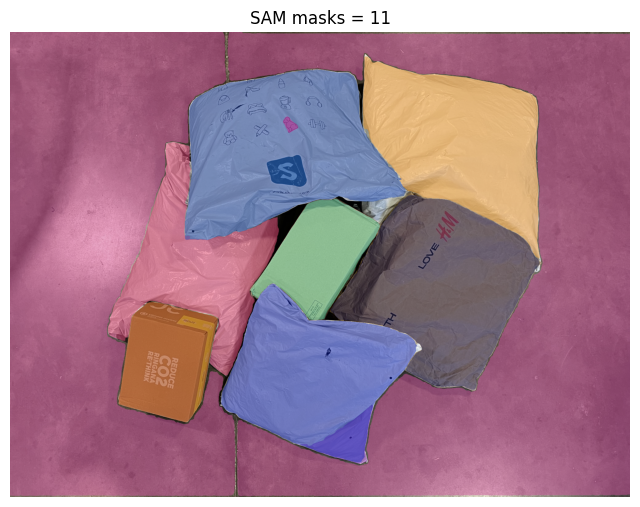

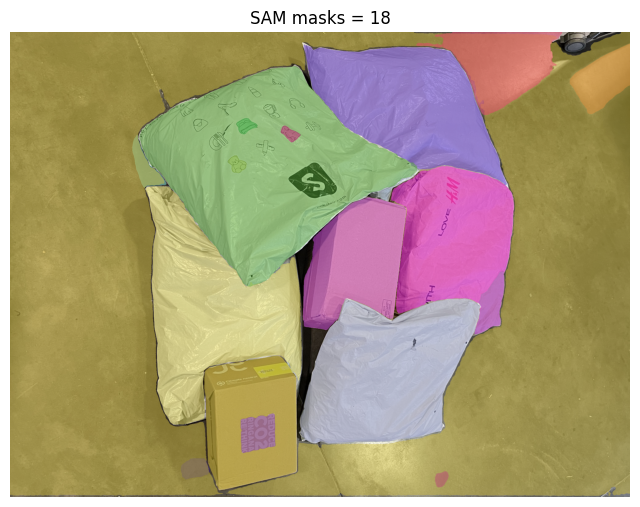

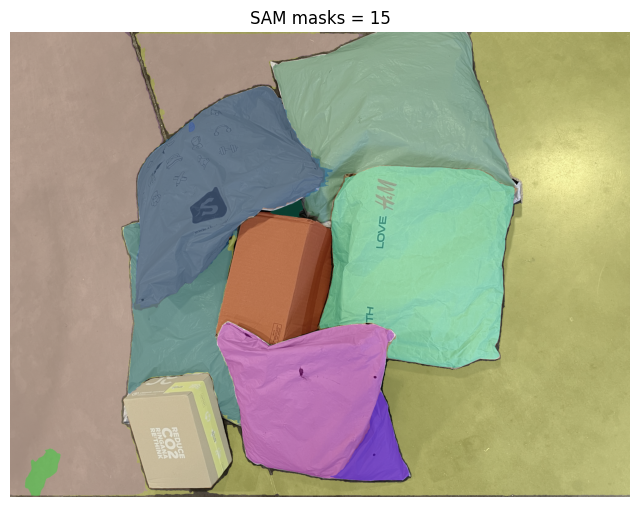

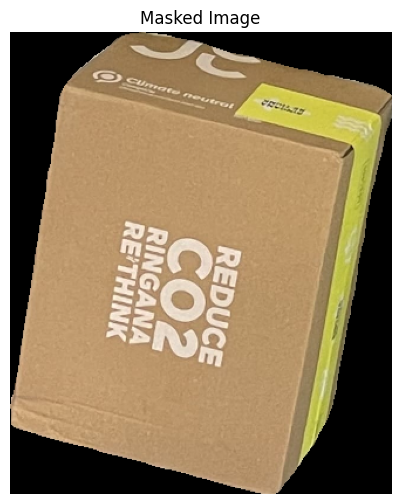

a single package


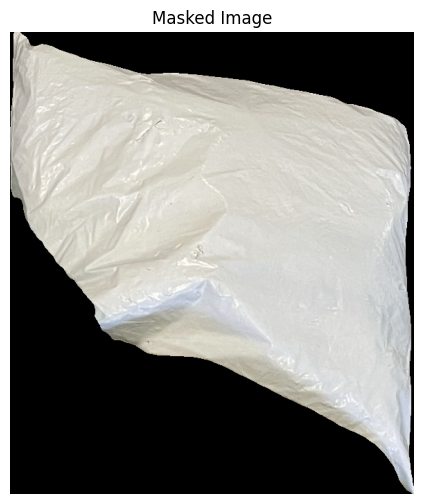

a single package


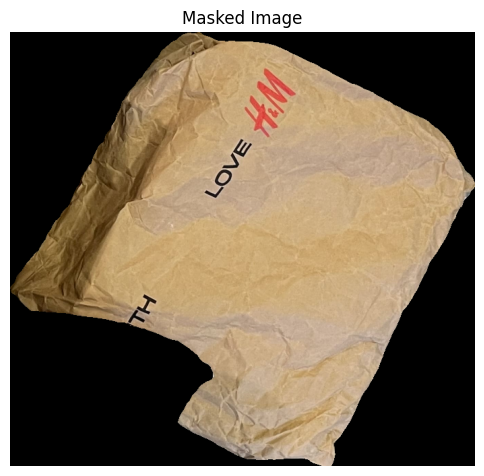

a single package


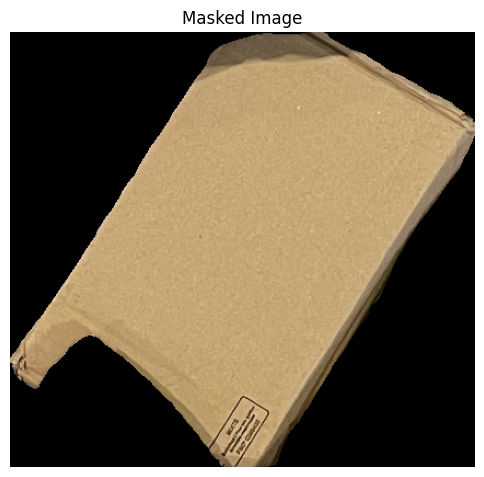

a single package


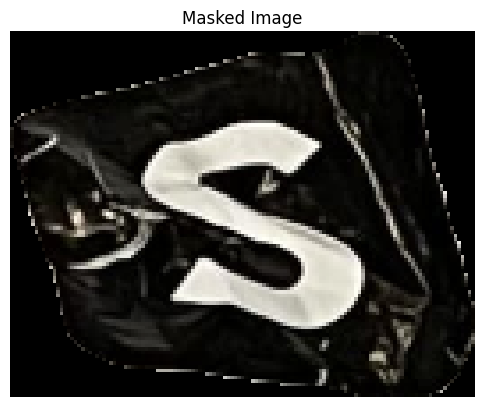

background


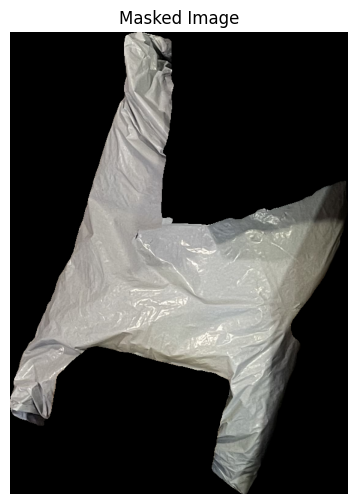

a single package


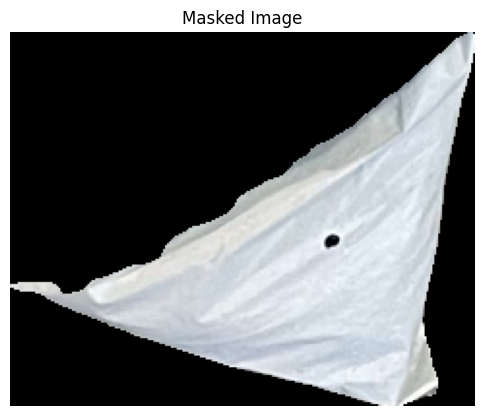

a single package


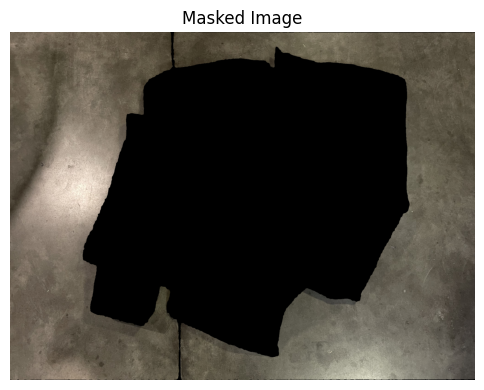

background


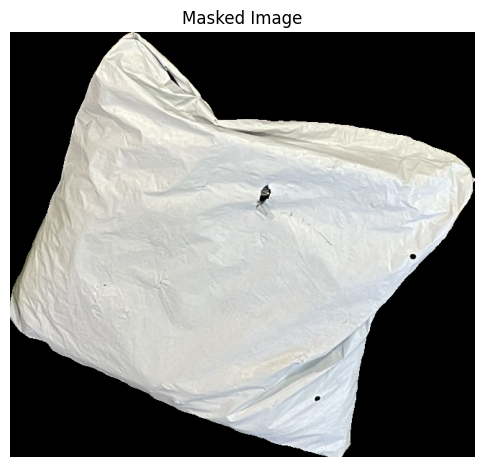

a single package


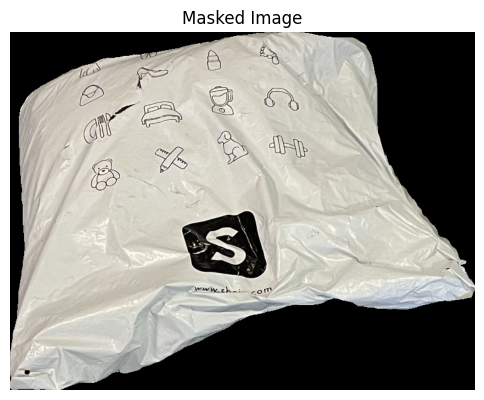

a single package


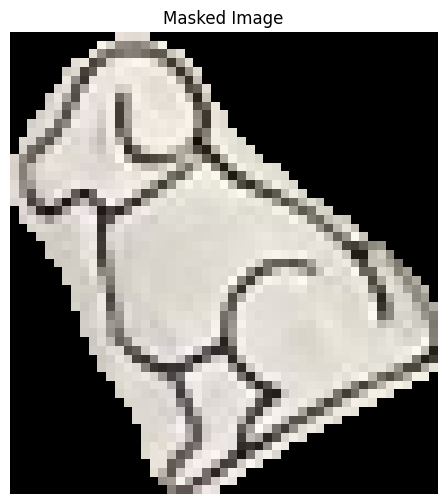

background


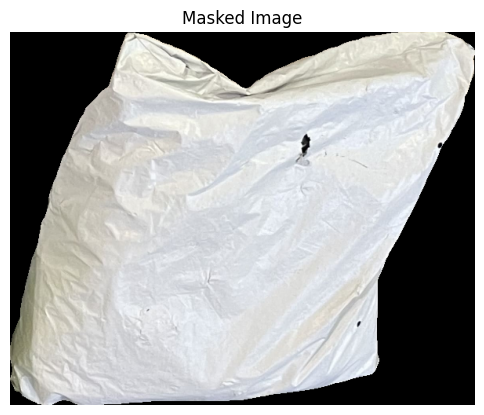

a single package


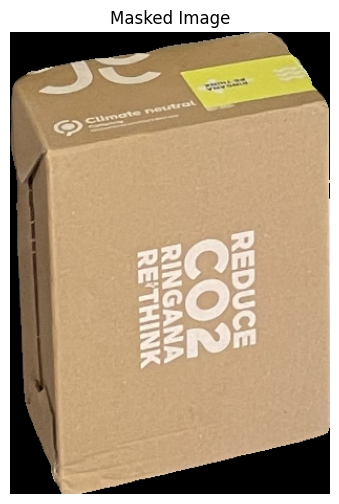

a single package


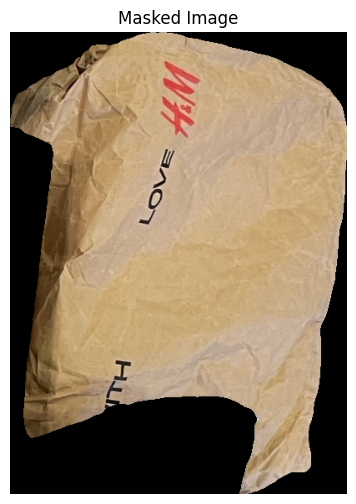

a single package


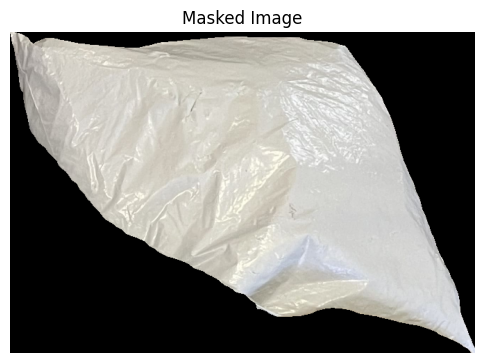

a single package


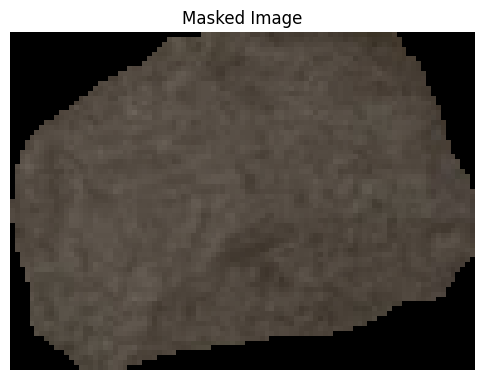

background


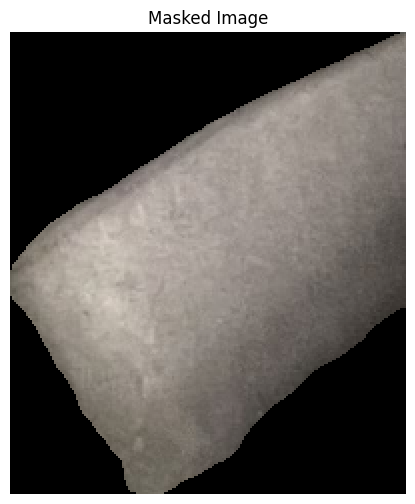

background


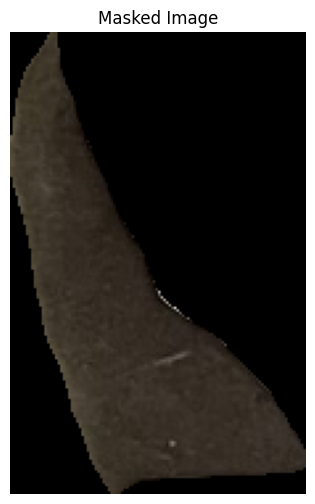

background


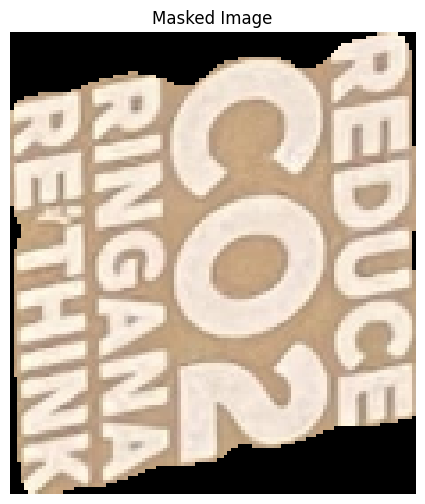

a single package


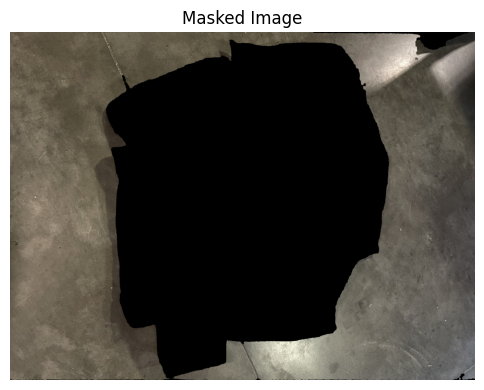

background


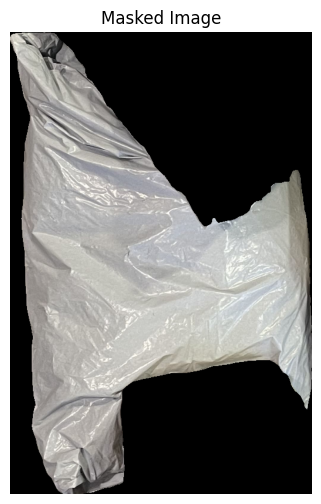

a single package


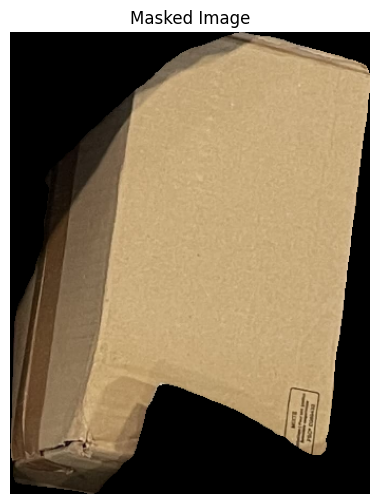

a single package


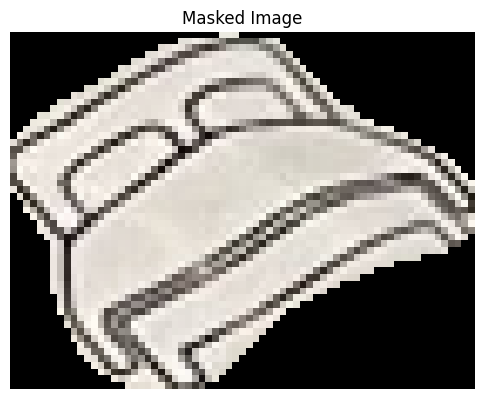

background


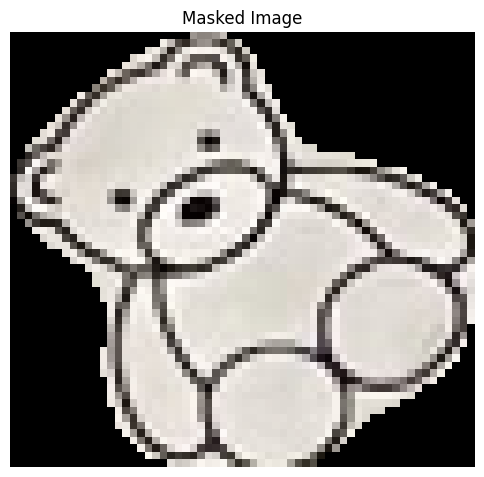

background


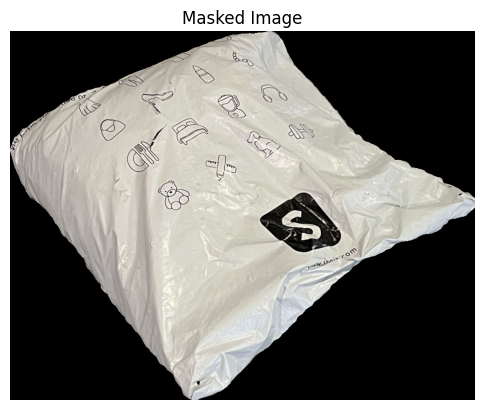

a single package


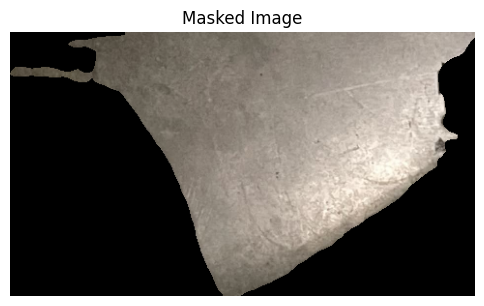

background


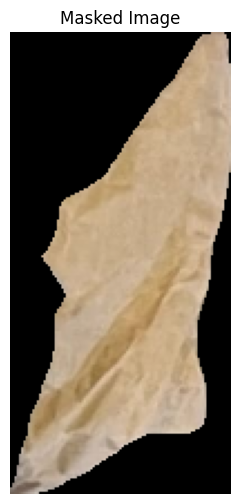

background


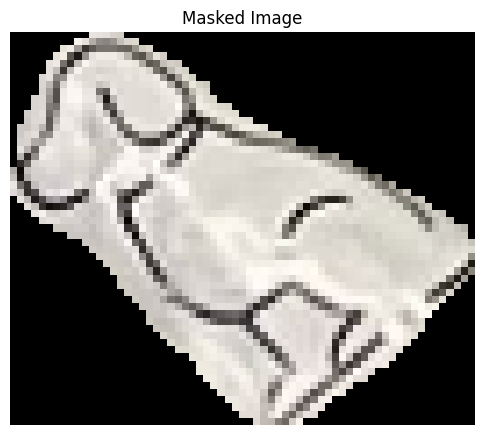

a single package


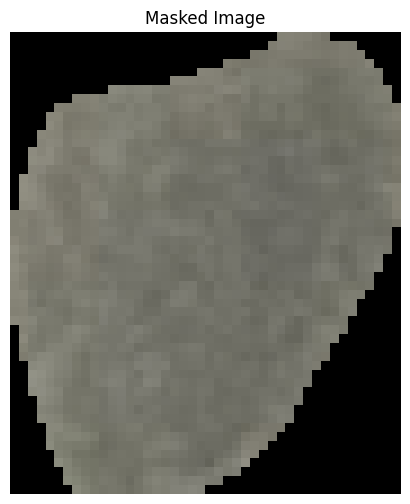

background


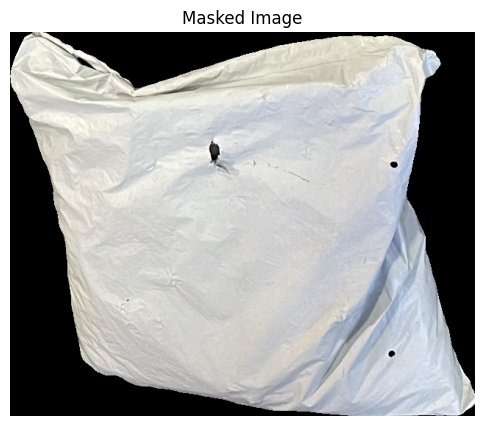

a single package


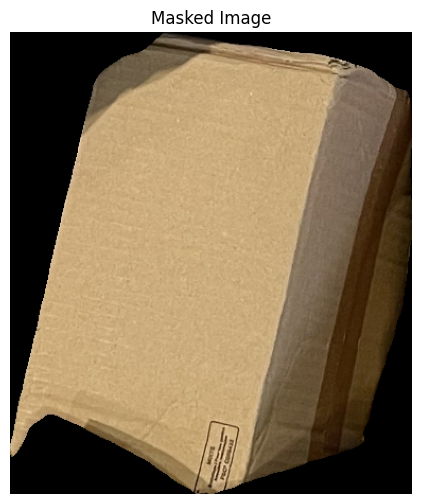

a single package


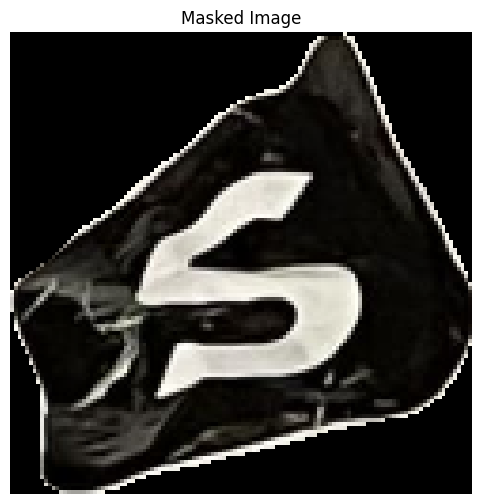

background


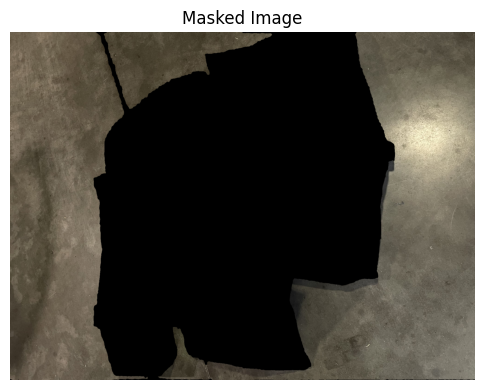

background


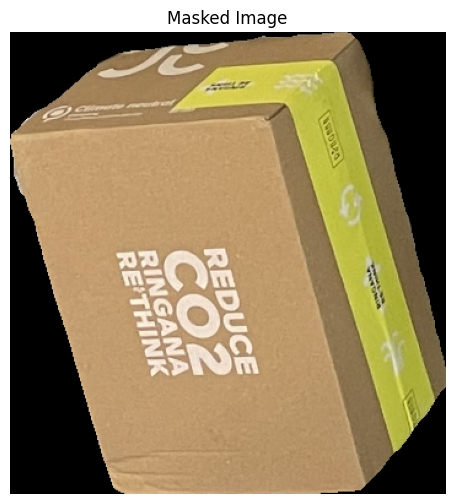

a single package


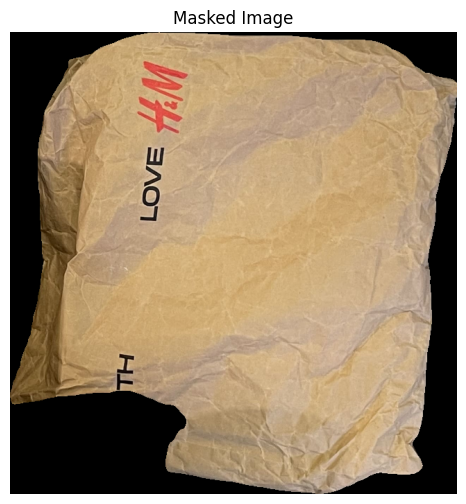

a single package


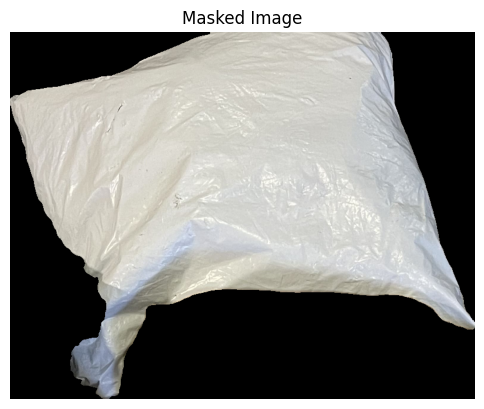

a single package


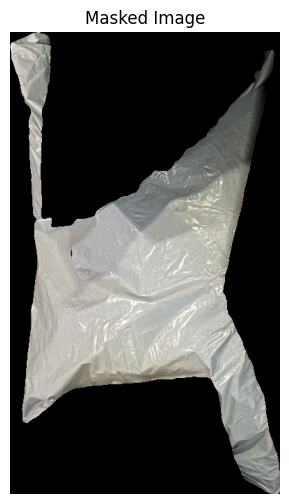

a single package


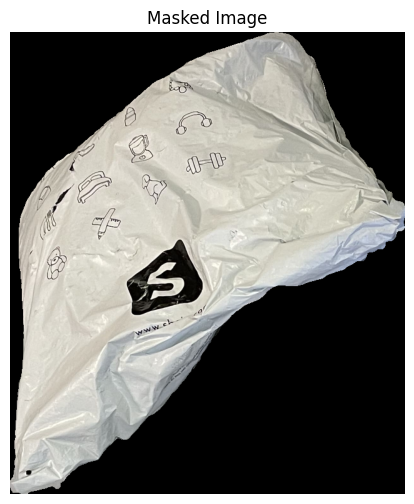

a single package


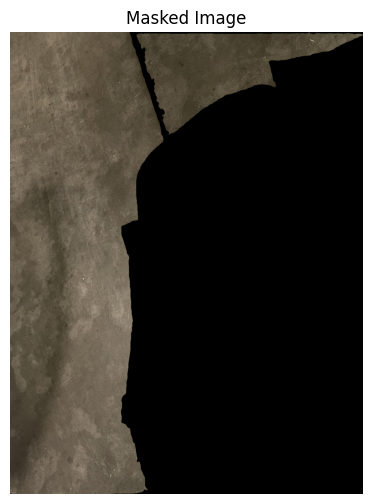

background


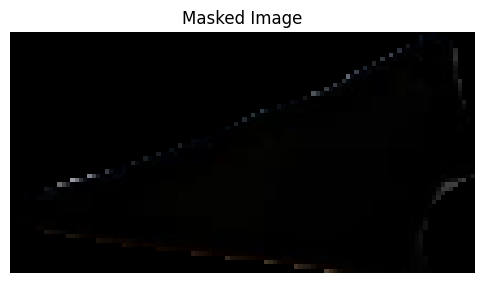

background


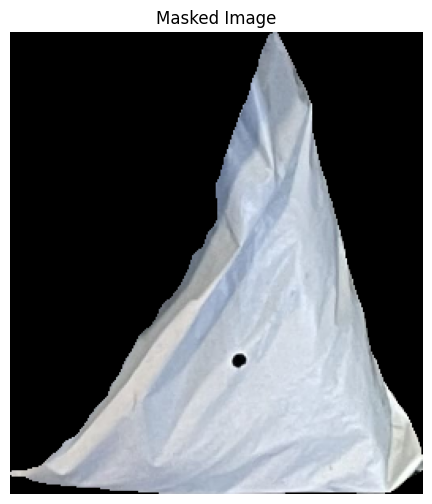

a single package


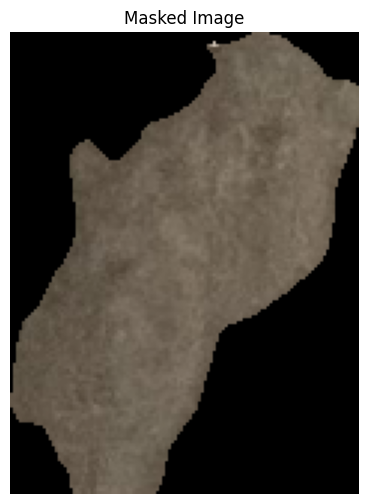

background


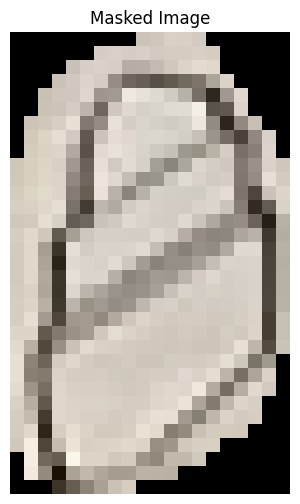

background


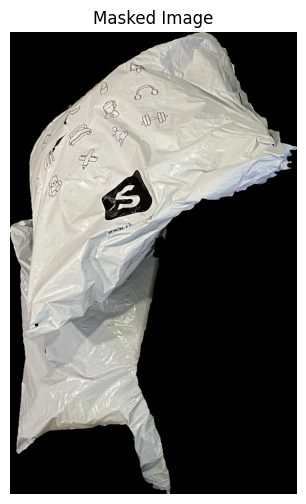

a single package


[2025/07/30 14:56:18 hloc INFO] Extracting local features with configuration:
{'model': {'max_keypoints': 5000, 'name': 'superpoint', 'nms_radius': 3},
 'output': 'feats-superpoint-n4096-rmax1600',
 'preprocessing': {'grayscale': True, 'resize_force': True, 'resize_max': 1600}}
[2025/07/30 14:56:18 hloc INFO] Found 3 images in root results3D/background_removal/images_without_bk.


Loaded SuperPoint model


100%|██████████| 3/3 [00:00<00:00,  6.84it/s]
[2025/07/30 14:56:19 hloc INFO] Finished exporting features.
0it [00:00, ?it/s]

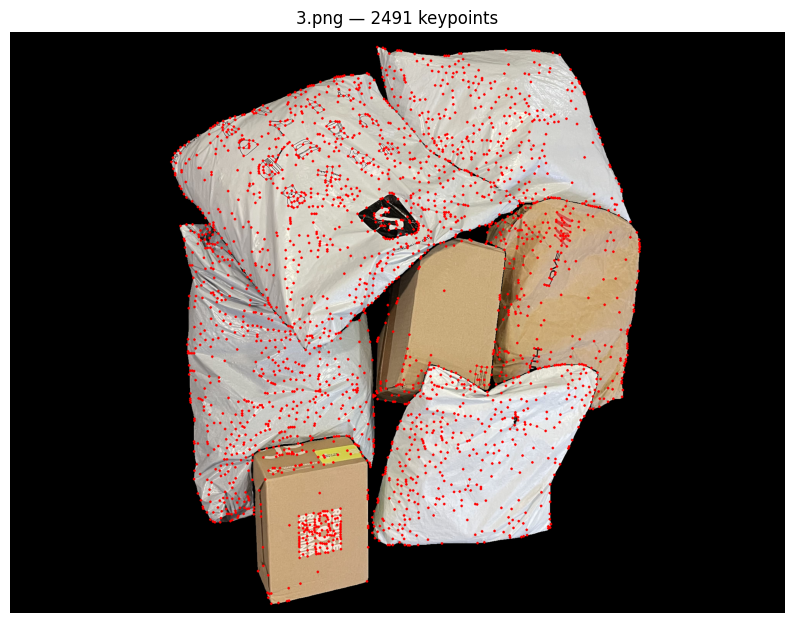

1it [00:00,  3.54it/s]

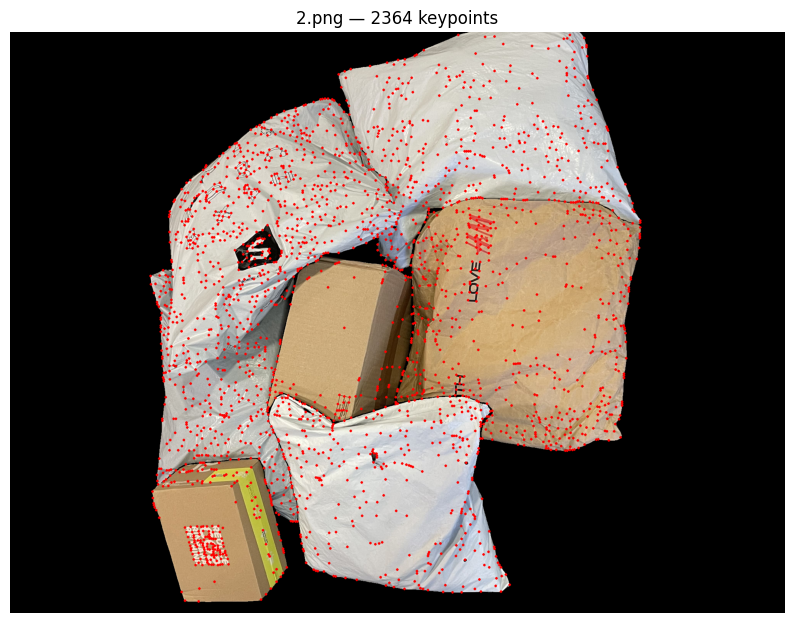

2it [00:00,  3.65it/s]

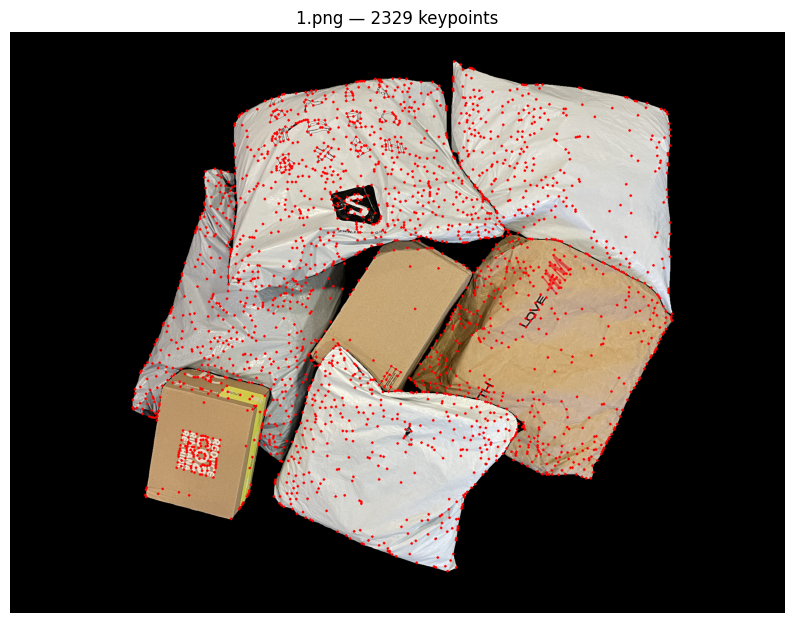

3it [00:00,  3.71it/s]
3it [00:00, 14250.18it/s]
[2025/07/30 14:56:20 hloc INFO] Matching local features with configuration:
{'model': {'match_threshold': 0.1,
           'name': 'superglue',
           'sinkhorn_iterations': 20,
           'weights': 'outdoor'},
 'output': 'matches-superglue'}


Loaded SuperGlue model ("outdoor" weights)


100%|██████████| 3/3 [00:00<00:00,  3.07it/s]
[2025/07/30 14:56:21 hloc INFO] Finished exporting matches.


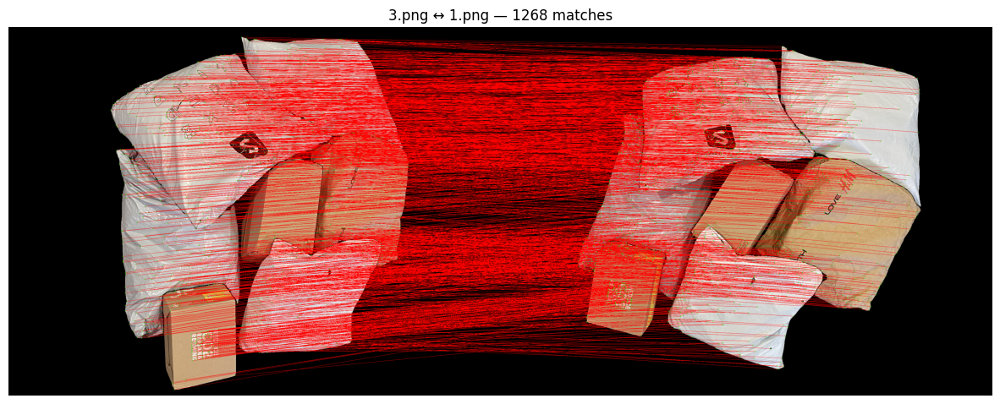

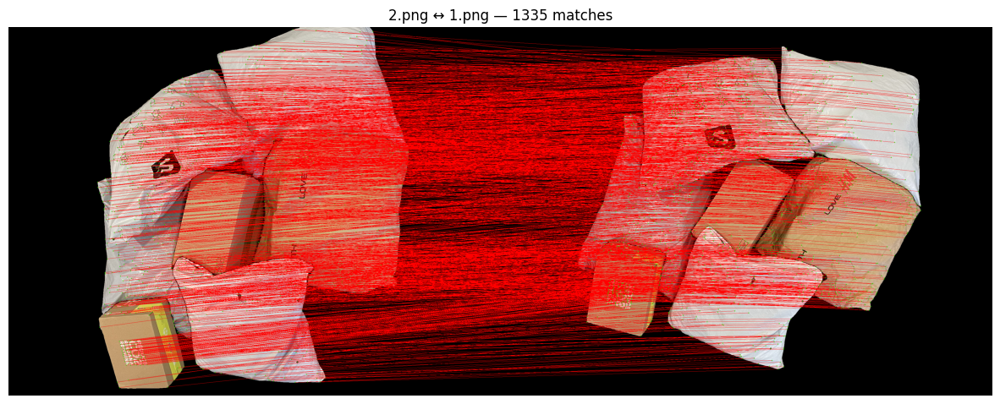

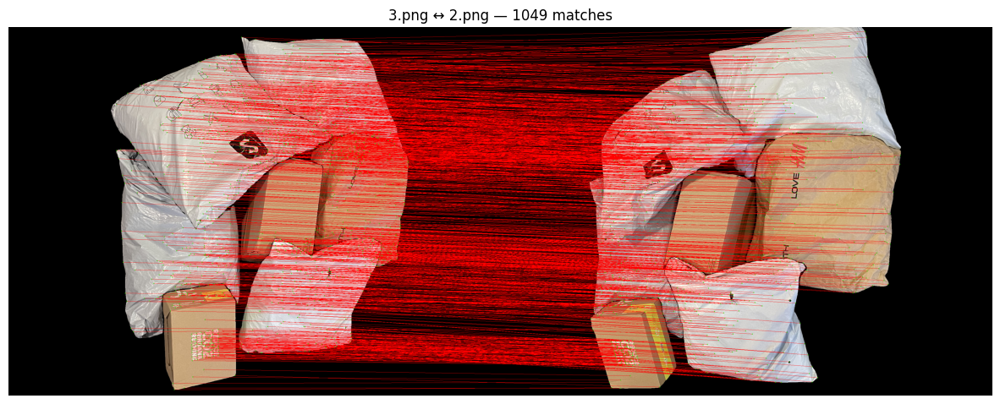

[2025/07/30 14:56:22 hloc INFO] Writing COLMAP logs to results3D/sfm/reconstruction/sparse/colmap.LOG.*
[2025/07/30 14:56:22 hloc WARNING] The database already exists, deleting it.
[2025/07/30 14:56:22 hloc INFO] Creating an empty database...
[2025/07/30 14:56:22 hloc INFO] Importing images into the database...
[2025/07/30 14:56:22 hloc INFO] Importing features into the database...
100%|██████████| 3/3 [00:00<00:00, 1328.29it/s]
[2025/07/30 14:56:22 hloc INFO] Importing matches into the database...
100%|██████████| 3/3 [00:00<00:00, 1131.05it/s]
[2025/07/30 14:56:22 hloc INFO] Running 3D reconstruction...
Reconstruction 0: 100%|██████████| 3/3 [00:00<00:00,  9.59images/s, registered]
[2025/07/30 14:56:23 hloc INFO] Reconstructed 1 model(s).
[2025/07/30 14:56:23 hloc INFO] Largest model is #0 with 3 images.
[2025/07/30 14:56:23 hloc INFO] Reconstruction statistics:
Reconstruction:
	num_rigs = 3
	num_cameras = 3
	num_frames = 3
	num_reg_frames = 3
	num_images = 3
	num_points3D = 949
	num

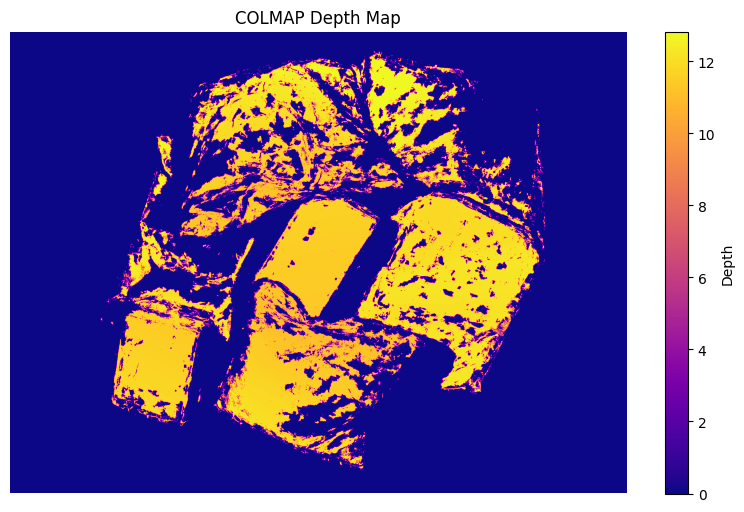

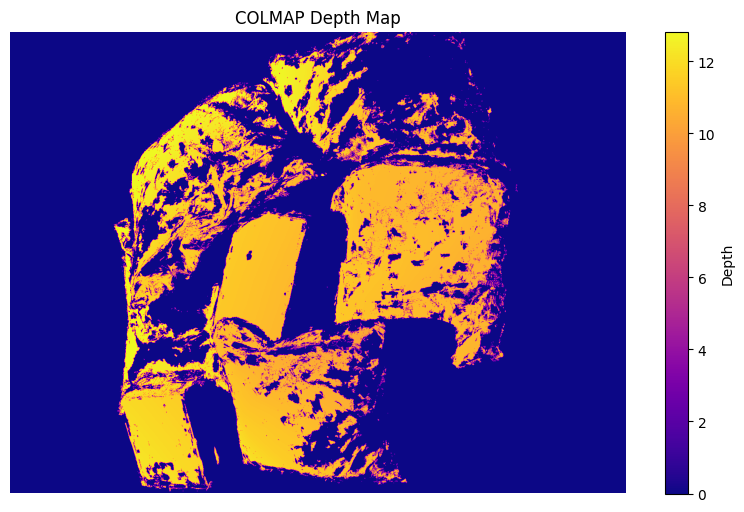

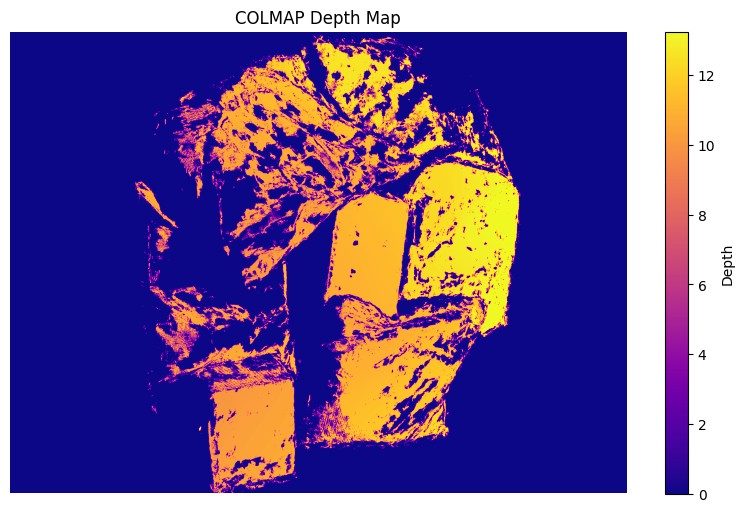

I20250730 14:59:54.329901 134589314699264 misc.cc:205] 
StereoFusion::Options
---------------------
I20250730 14:59:54.329954 134589314699264 fusion.cc:89] mask_path: 
I20250730 14:59:54.329960 134589314699264 fusion.cc:90] max_image_size: -1
I20250730 14:59:54.329963 134589314699264 fusion.cc:91] min_num_pixels: 3
I20250730 14:59:54.329967 134589314699264 fusion.cc:92] max_num_pixels: 10000
I20250730 14:59:54.329969 134589314699264 fusion.cc:93] max_traversal_depth: 100
I20250730 14:59:54.329972 134589314699264 fusion.cc:94] max_reproj_error: 3
I20250730 14:59:54.329982 134589314699264 fusion.cc:95] max_depth_error: 1
I20250730 14:59:54.329985 134589314699264 fusion.cc:96] max_normal_error: 10
I20250730 14:59:54.329990 134589314699264 fusion.cc:97] check_num_images: 50
I20250730 14:59:54.329992 134589314699264 fusion.cc:98] use_cache: 0
I20250730 14:59:54.329997 134589314699264 fusion.cc:99] cache_size: 32
I20250730 14:59:54.330000 134589314699264 fusion.cc:102] bbox_min: -3.40282e+38

Precompute neighbors.[========================================] 100%
Clustering[========================================] 100%
Precompute neighbors.[========================================] 100%
Precompute neighbors.[========================================] 100%
Precompute neighbors.[========================================] 100%
Clustering[========================================] 100%
Precompute neighbors.[========================================] 100%
Clustering[========================================] 100%
Precompute neighbors.[========================================] 100%
Precompute neighbors.[========================================] 100%
Clustering[========================================] 100%


In [45]:
image_reshape_size = (1024 * 2, 768 * 2)

# Perform instance segmentation
images_folder = Path('Data')
instance_masks_folder = Path('results3D/masks')
instance_segmentation(images_folder, instance_masks_folder, image_reshape_size, 1)

# Classify each instance using CLIP.
labels_folder = Path('results3D/labels')
clip_cls(images_folder, instance_masks_folder, labels_folder, image_reshape_size, 1)

# Remove background using the CLIP labels so that the features matching for SfM is more accurate.
bk_removed_folder = Path('results3D/background_removal')
remove_background(images_folder, instance_masks_folder, labels_folder, bk_removed_folder, image_reshape_size)

# SfM sparse reconstruction.
images_rmbk_folder = Path("results3D/background_removal/images_without_bk")
output_folder = Path("results3D/sfm/features")
pairs_file = Path(output_folder / "pairs.txt")
features_path = Path(output_folder / "feats-superpoint-n4096-rmax1600.h5")
matches_path = Path(output_folder / "feats-superpoint-n4096-rmax1600_matches-superglue_pairs.h5")
reconstruction_folder = Path("results3D/sfm/reconstruction/sparse")
generate_feature_descriptors(images_rmbk_folder, output_folder, 1)
images_matching(images_rmbk_folder, output_folder, pairs_file, features_path, matches_path, 1)
sparse_3D_reconstruction(images_rmbk_folder, pairs_file, features_path, matches_path, reconstruction_folder)

# Use SfM results to undistort images, which will change the resolution making the previous masks and images 
# dismatch, that's why I extracted masks again later.
sparse_dir = Path("results3D/sfm/reconstruction/sparse")
dense_dir = Path("results3D/sfm/reconstruction/dense")
images_undistortion(images_rmbk_folder, sparse_dir, dense_dir)

# Re-extract instance masks and labels but with undistorted images.
images_undistorted_folder = Path('results3D/sfm/reconstruction/dense/images')
undistorted_instance_masks_folder = Path('results3D/undistorted/masks')
instance_segmentation(images_undistorted_folder, undistorted_instance_masks_folder, image_type='png')
labels_undistorted_folder = Path('results3D/undistorted/labels')
clip_cls(images_undistorted_folder, undistorted_instance_masks_folder, labels_undistorted_folder, image_type='png')

# Match instance masks across different views.
embeddings_folder = labels_undistorted_folder
masks_path = get_sorted_paths(undistorted_instance_masks_folder, 'npz')
imgs_path = get_sorted_paths(images_undistorted_folder, 'png')
label_paths = get_sorted_paths(labels_undistorted_folder, 'npy')
match_parcel_segmentations(embeddings_folder, undistorted_instance_masks_folder, masks_path, imgs_path, label_paths, 1)

# Estimate depth.
depth_estimation(dense_dir, 'geometric', 1)

# Reconstruct each instance by masking other things in the depth map out.
ori_depth_folder = Path('results3D/sfm/reconstruction/dense/stereo/depth_maps')
backup_depth_folder = Path('results3D/sfm/reconstruction/dense/stereo/depth_maps_backup')
if backup_depth_folder.exists():
    shutil.copytree(backup_depth_folder, ori_depth_folder, dirs_exist_ok=True)
else:
    shutil.copytree(ori_depth_folder, backup_depth_folder)
new_depth_folder = ori_depth_folder
reconstruct_objects(
    backup_depth_folder, 
    Path(undistorted_instance_masks_folder/"matched_segs_indices.npy"), 
    undistorted_instance_masks_folder, 
    new_depth_folder, 
    dense_dir
)

# Refine the instance point cloud reconstruction.
pcd_folder = Path('results3D/sfm/reconstruction/dense')
pcd_paths = get_sorted_paths(pcd_folder, 'ply')
cameras_path = Path('results3D/sfm/reconstruction/dense/sparse/cameras.bin')
images_path = Path('results3D/sfm/reconstruction/dense/sparse/images.bin')
masks_folder = Path('results3D/undistorted/masks')
refined_folder = Path('results3D/refined')
matched_sequences = np.load(Path('results3D/undistorted/masks/matched_segs_indices.npy'))
for i, pcd_path in enumerate(pcd_paths):
    refine_pcd_pipeline(Path(f'results3D/sfm/reconstruction/dense/{pcd_path.stem}.ply'), cameras_path, images_path, masks_folder, refined_folder, matched_sequences, i+1, 3)

# Reconstruct the whole scene.
reconstruct_scene(dense_dir, refined_folder, Path(refined_folder / "full_pcd.ply"))

# Phase2-Estimate Grasp Postion, Surface and Gestures

In [1]:
import yaml
import torch
import open3d as o3d
import numpy as np
from sklearn.neighbors import NearestNeighbors
import glob
from tqdm import tqdm
from read_write_model import read_cameras_binary, read_images_binary
from contact_graspnet_pytorch.contact_graspnet import ContactGraspnet
from contact_graspnet_pytorch.data import preprocess_pc_for_inference

from open3d.geometry import PointCloud
from typing import Tuple, List

Jupyter environment detected. Enabling Open3D WebVisualizer.
[Open3D INFO] WebRTC GUI backend enabled.
[Open3D INFO] WebRTCWindowSystem: HTTP handshake server disabled.


In [2]:
with open("contact_graspnet_pytorch/checkpoints/contact_graspnet/config.yaml", 'r') as f:
    cfg = yaml.safe_load(f)

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = ContactGraspnet(cfg, device).to(device).eval()

ckpt = torch.load("contact_graspnet_pytorch/checkpoints/contact_graspnet/checkpoints/model.pt", map_location=device)
model.load_state_dict(ckpt['model'], strict=True)

def grasp_object(pcd: PointCloud, top_k: int = 1) -> Tuple[np.array]:
    """
    Given the point cloud of an object, the function returns best top_k grasp positions, points, hand widths.T

    Args:
        top_k (int):
            How many grasp positions to return.

    Returns:
        idxs (np.array):
            The indices of the best grasp anchor points.
        gsp_poses (np.array):
            The grasp pose, including the translation and the rotation.
        gsp_scores (np.array):
            Confidence of a successful grasp.
        gsp_points (np.array):
            Possible grasp locations of the object.
        gsp_widths (np.array):
            The width of the hand to grasp the object.
    """
    if cfg['DATA'].get('input_normals', False):
        pcd.estimate_normals(search_param=o3d.geometry.KDTreeSearchParamKNN(knn=30))
        pts = np.asarray(pcd.points)
        norms = np.asarray(pcd.normals)
        pc_raw = np.hstack([pts, norms])  
    else:
        pc_raw = np.asarray(pcd.points)  

    pc_proc, pc_mean = preprocess_pc_for_inference(
        pc_raw,
        cfg['DATA']['raw_num_points'],
        return_mean=True,
        convert_to_internal_coords=True # Flips x and y.
    )

    input_tensor = torch.from_numpy(pc_proc[None]).float().to(device)

    with torch.no_grad():
        outputs = model(input_tensor)

    poses = outputs['pred_grasps_cam'][0].cpu().numpy() # (N, 4, 4)
    scores = outputs['pred_scores'][0,:,0].cpu().numpy() # (N, ) 
    points = outputs['pred_points'][0].cpu().numpy() # (N, 3)     
    widths = outputs['offset_pred'][0].cpu().numpy() # (1, N)    

    poses [:,:3, 3] += pc_mean
    points += pc_mean

    points[:, 0:2] *= -1
    poses[:, 0:2, 3] *= -1
    
    idxs = np.argsort(scores)[-top_k:]

    gsp_poses = poses[idxs]
    gsp_scores = scores[idxs] 
    gsp_points = points[idxs]   
    gsp_widths = widths[:, idxs] 

    return idxs, gsp_poses, gsp_scores, gsp_points, gsp_widths

In [3]:
def find_grasp_point(full_pcd: PointCloud, obj_pcd: PointCloud, gsp_points: np.array) -> np.array:
    """
    Fine the closest point of the full point cloud to the grasp point.

    Args:
        full_cloud (PointCloud):
            The scene's full point cloud.
        obj_pcd (PointCloud):
            The object's point cloud.
        gsp_points (np.array):
            An np.array containing the grasp locations.

    Returns:
        full_pts[full_match_idx] (np.array):
            The corresponding point location.
    """
    full_pts = np.asarray(full_pcd.points)
    obj_pts = np.asarray(obj_pcd.points)

    grasp_pt = gsp_points[0]
    
    nn_obj = NearestNeighbors(n_neighbors=1).fit(obj_pts)
    _, obj_nn_idx = nn_obj.kneighbors(grasp_pt.reshape(1, -1))
    obj_nearest_pt = obj_pts[obj_nn_idx[0][0]]

    nn_full = NearestNeighbors(n_neighbors=1).fit(full_pts)
    _, full_nn_idx = nn_full.kneighbors(obj_nearest_pt.reshape(1, -1))
    full_match_idx = full_nn_idx[0][0]

    return full_pts[full_match_idx]

In [4]:
def highlight_points(pcd: PointCloud, points: np.array, color: tuple) -> PointCloud:
    """
    Hightlight specific points in the original pcd using a particular color.

    Args:
        points (np.array):
            The locations of the points to be highlighted.
        color (tuple):
            The color of highlight.

    Returns:
        merged_pcd (PointCloud):
            The point cloud with highlighted color.
    """
    full_pts = np.asarray(pcd.points)
    full_clr = np.asarray(pcd.colors)

    for point in points:
        point = point.astype(np.float64).reshape(3, 1)
        
        sphere = o3d.geometry.TriangleMesh.create_sphere(radius=7e-2)
        sphere.translate(point, relative=False)
        sphere_pcd = sphere.sample_points_uniformly(number_of_points=1000)
        sphere_pts = np.asarray(sphere_pcd.points)
        sphere_clr = np.tile(color, (len(sphere_pts), 1))

        full_pts = np.vstack([full_pts, sphere_pts])
        full_clr = np.vstack([full_clr, sphere_clr])

    merged_pcd = o3d.geometry.PointCloud()
    merged_pcd.points = o3d.utility.Vector3dVector(full_pts)
    merged_pcd.colors = o3d.utility.Vector3dVector(full_clr)

    return merged_pcd

In [5]:
def extract_surface_by_normal_similarity(pcd: PointCloud, target_points: np.ndarray, angle_threshold_deg=20, distance_threshold: float = 0.02, k_neighbors=50) -> Tuple[PointCloud, set]:
    """
    Region grow a surface around target points by similar normals, using kNN graph traversal.

    Args:
        pcd (PointCloud): 
            PointCloud with normals.
        target_point (np.array): 
            Target points around which to build surfaces.
        angle_threshold_deg (float): 
            Max allowed angle deviation in normals in degrees (360).
        k_neighbors (int): 
            Number of neighbors to search in each iteration.

    Returns:
        pcd.select_by_index (PointCloud): 
            Sub-cloud with coherent surface points.
        region (set): 
            Set of indices of the surface.
    """
    tree = o3d.geometry.KDTreeFlann(pcd)
    points = np.asarray(pcd.points)
    normals = np.asarray(pcd.normals)
    angle_threshold_rad = np.deg2rad(angle_threshold_deg)

    total_region = set()

    for target_point in target_points:
        seed_idx = np.argmin(np.linalg.norm(points - target_point, axis=1))
        seed_normal = normals[seed_idx]
        seed_coord = points[seed_idx]

        visited = set()
        region = set([seed_idx])
        queue = [seed_idx]

        while queue:
            current = queue.pop()
            visited.add(current)

            [_, nbrs, _] = tree.search_knn_vector_3d(pcd.points[current], k_neighbors)

            for ni in nbrs:
                if ni in visited:
                    continue

                # 1. Check angular similarity
                dot = np.dot(seed_normal, normals[ni])
                dot = np.clip(dot, -1.0, 1.0)
                angle = np.arccos(dot)

                # 2. Check spatial distance from seed
                dist = np.linalg.norm(points[ni] - seed_coord)

                if angle < angle_threshold_rad and dist < distance_threshold:
                    region.add(ni)
                    queue.append(ni)
                    visited.add(ni)

        total_region.update(region)

    region_sorted = sorted(list(total_region))
    return pcd.select_by_index(region_sorted), total_region

In [6]:
def highlight_surface_region_by_index(full_pcd: PointCloud, indices: set, overlay_color: tuple = (0, 1, 0), alpha: float = 0.5) -> PointCloud:
    """
    Highlights the surface region in full point cloud using known point indices.

    Args:
        full_pcd (PointClod): 
            The full scene point cloud.
        indices (set): 
            Set of indices in full_pcd to color.
        overlay_color (tuple): 
            RGB color to blend.
        alpha (float): 
            Transparency level (0 = no change, 1 = full overlay).

    Returns:
        full_pcd (PointCloud):
            Updated full_pcd with overlay applied.
    """
    colors = np.asarray(full_pcd.colors)

    for idx in indices:
        original = colors[idx]
        blended = (1 - alpha) * original + alpha * np.array(overlay_color)
        colors[idx] = blended

    full_pcd.colors = o3d.utility.Vector3dVector(colors)
    return full_pcd

In [7]:
def visualize_normal(pcd: PointCloud, grasp_pt: np.array):
    """
    Given the point cloud and the corresponding points for grasping, the function
    visualizes the normal vectors of the grasp ponints.
    """
    if not pcd.normals:
        pcd.estimate_normals(search_param=o3d.geometry.KDTreeSearchParamKNN(knn=30))
    pcd.orient_normals_consistent_tangent_plane(k=30)
    points = np.asarray(pcd.points)
    normals = np.asarray(pcd.normals)
    arrows = []

    for target in grasp_pt:
        idx = int(np.argmin(np.linalg.norm(points - target, axis=1)))
        point = points[idx]
        norm = normals[idx]
        norm /= np.linalg.norm(norm) # Normalize to unit length.

        arrow = o3d.geometry.TriangleMesh.create_arrow(
            cylinder_radius=0.05,
            cone_radius=0.1,
            cylinder_height=1,
            cone_height=0.3
        )

        axis = np.cross([0, 0, 1], norm)
        angle = np.arccos(np.clip(np.dot([0, 0, 1], norm), -1.0, 1.0))
        if np.linalg.norm(axis) > 1e-6:
            R = o3d.geometry.get_rotation_matrix_from_axis_angle(axis / np.linalg.norm(axis) * angle)
            arrow.rotate(R, center=(0, 0, 0))
        arrow.translate(point)
        arrow.paint_uniform_color([1.0, 0.0, 0.0]) 
        arrows.append(arrow)

    o3d.visualization.draw_geometries([pcd] + arrows)

In [8]:
def extract_grasp_gestures(poses_list: np.array) -> List[np.array]:
    """
    The function extracts (x, y, z, angle) from the poses results given by
    contact_graspnet model.

    Args:
        poses_list (np.array):
            The poses for all the grasp points.
    
    Returns:
        gestures_list (List[np.array]):
            The (x, y, z, angle) for all the points.
    """
    gestures_list = []

    for poses in poses_list:
        xyz = poses[:, :3, 3]  
        R = poses[:, :3, :3]   
        closing_axes = R[:, :, 0]  
        vx = closing_axes[:, 0]
        vy = closing_axes[:, 1]
        angles = np.arctan2(vy, vx)  
        gestures = np.hstack((xyz, angles[:, None])) 
        gestures_list.append(gestures)

    return gestures_list

In [ ]:
# Predict the grasp positions of each object.
scene_grasps = []
grasp_poses = []

full_pcd = o3d.io.read_point_cloud(f"results3D/refined/full_pcd.ply")

pattern = f"results3D/refined/object_*.ply"
matching_files = glob.glob(pattern)
for path in matching_files:
    obj_pcd = o3d.io.read_point_cloud(path)
    _, poses, _, gsp_points, _ = grasp_object(obj_pcd) # Get the grasp gestures and positions for each object.
    scene_grasps.append(gsp_points)
    grasp_poses.append(poses)

scene_grasps = np.array(scene_grasps)
colored_pcd = highlight_points(full_pcd, scene_grasps.reshape(-1, 3), (1, 0, 0)) # Highlight the grasp location.
o3d.io.write_point_cloud(f"results3D/grasped/scene_grasped.ply", colored_pcd, write_ascii=True)
np.save(f"results3D/grasped/scene_grasp_points.npy", scene_grasps)

# Transform the pose output to (x, y, z, angle (arctan)) indicating the grasp gesture. 
gestures_list = extract_grasp_gestures(grasp_poses)
np.save(f"results3D/grasped/arm_gestures.npy", np.array(gestures_list))

# Highligh the surface of the object around the grasp point.
pcd = o3d.io.read_point_cloud(f"results3D/grasped/scene_grasped.ply")
pcd.estimate_normals(search_param=o3d.geometry.KDTreeSearchParamKNN(knn=30))
pcd.orient_normals_consistent_tangent_plane(k=50)
grasp_pt = np.load(f'results3D/grasped/scene_grasp_points.npy')
surface, idxs = extract_surface_by_normal_similarity(pcd, grasp_pt, angle_threshold_deg=35, distance_threshold=1, k_neighbors=50)
surfaced_pcd = highlight_surface_region_by_index(pcd, idxs, alpha=0.5)
o3d.io.write_point_cloud(f"results3D/grasped/scene_surface.ply", surfaced_pcd)

# Visualize the normal vector for each grasp point.
visualize_normal(surfaced_pcd, grasp_pt)